# OVRO–LWA Single-File SK Pipeline (Demo)

This notebook demonstrates a **two-stage Spectral Kurtosis (SK) pipeline** for a **single OVRO–LWA HDF5 dataset**, using the command-line tools we developed:

- `ovro_lwa_sk_stream.py` – streaming SK computation (Stage 1)  
- `ovro_lwa_rfi_clean.py` – RFI cleaning and frequency-block integration (Stage 2)  
- `ovro_lwa_sk_quicklook.py` – quicklook visualizations for both products  

The goals of this notebook are:

1. To show the **full analysis pipeline** for one file, step by step.  
2. To let you **re-run quicklook plots** with different visualization options without recomputing the heavy SK/RFI stages.  
3. To serve as a **pedagogical example** that students can inspect, modify, and extend.


---

## 1. Configuration

In the next cell, we configure:

- The **input OVRO–LWA file** (`RAW_FILE`).
- The **output directories** for stream products, RFI-cleaned products, and PNG figures.
- The SK streaming parameters (`STREAM_ARGS`).
- The RFI cleaning parameters (`RFI_ARGS`).
- The plotting options used by the quicklook scripts (`QUICKLOOK_ARGS`).

You typically only edit this cell when you:

- Change the input file,
- Change SK/RFI parameters, or
- Want different plotting defaults.


In [105]:
import os
import shlex
import subprocess
import glob
from pathlib import Path

def run_cmd(cmd):
    """Run a subprocess command with basic logging."""
    print("[CMD]", " ".join(cmd))
    result = subprocess.run(cmd, check=True)
    return result

def base_noext(path: str) -> str:
    """Return basename without extension."""
    return os.path.splitext(os.path.basename(path))[0]


In [106]:
# ======================
# USER CONFIGURATION
# ======================

# Path to a single OVRO–LWA raw HDF5 file (EDIT THIS)
RAW_FILE = "C:\\Users\\gelu_\\Dropbox\\@Projects\\ovro-lwa\\application\\060963_182827094797b4e9492"  # <-- change to a real file

# Base directory for all outputs produced by this notebook
BASE_OUT = "./ovro_lwa_demo_outputs"

# Script locations (assumed to be on the PYTHONPATH / in current working dir)
STREAM_SCRIPT = "ovro_lwa_sk_stream.py"
RFI_CLEAN_SCRIPT = "ovro_lwa_rfi_clean.py"
QUICKLOOK_SCRIPT = "ovro_lwa_sk_quicklook.py"

# Derived output directories
STREAM_OUT = str(Path(BASE_OUT) / "stream")
RFI_OUT    = str(Path(BASE_OUT) / "rfi")
PNG_OUT    = str(Path(BASE_OUT) / "png")

# SK streaming parameters (Stage 1)
# These are passed directly to ovro_lwa_sk_stream.py AFTER the input filename.
STREAM_ARGS = "--M 64 --N 24 --d 1.0 --pfa 1e-3"

# RFI-clean parameters (Stage 2)
# Passed directly to ovro_lwa_rfi_clean.py AFTER the input stream file.
RFI_ARGS = "--F-block 8 --flag-mode and"

# Quicklook plotting options for both stages
# Passed directly to ovro_lwa_sk_quicklook.py AFTER the product file.
QUICKLOOK_ARGS = "--pol both --scale log --vmin 1e6 --vmax 1e8 --save-plot png --no-show"

# Control whether to actually recompute heavy stages.
# Once the corresponding HDF5 products exist, you can set these to False
# and re-run only the quicklook cells.
RUN_STREAM = True   # set False to reuse existing *_skstream.h5
RUN_RFI    = True   # set False to reuse existing *_rfi_*.h5


---

## 2. Prepare output directories

Here we create (if needed) three directories under `BASE_OUT`:

- `STREAM_OUT` – for SK stream products (`*_skstream.h5`)
- `RFI_OUT` – for RFI-cleaned products (`*_skstream_rfi_*.h5`)
- `PNG_OUT` – for all quicklook PNG figures

These directories can be changed in the configuration cell if you prefer a different layout.


In [107]:
# Make sure output directories exist
for d in (STREAM_OUT, RFI_OUT, PNG_OUT):
    Path(d).mkdir(parents=True, exist_ok=True)
    print(f"[INFO] Ensured directory exists: {d}")


[INFO] Ensured directory exists: ovro_lwa_demo_outputs\stream
[INFO] Ensured directory exists: ovro_lwa_demo_outputs\rfi
[INFO] Ensured directory exists: ovro_lwa_demo_outputs\png


In [108]:
# Utility: display PNG quicklook figures inside the notebook
from pathlib import Path
from IPython.display import Image, display

def show_pngs_in_dir(directory: str, pattern: str = "*.png"):
    # Display all PNG files in the given directory (matching pattern).
    dir_path = Path(directory)
    if not dir_path.exists():
        print(f"[SHOW] Directory does not exist: {dir_path}")
        return

    pngs = sorted(dir_path.glob(pattern))
    if not pngs:
        print(f"[SHOW] No PNG files matching {pattern} in {dir_path}")
        return

    for p in pngs:
        print(f"[SHOW] {p}")
        display(Image(filename=str(p)))


---

## 3. Stage 1 – Streaming SK computation

**What this stage does:**

- Reads the raw OVRO–LWA HDF5 file (`XX` and `YY` spectra, frequencies, and times).
- Applies the SK estimator with parameters:
  - Block length `M`,
  - Number of accumulations `N`,
  - Shape parameter `d`,
  - Probability of false alarm `pfa`.
- Processes the data sequentially in blocks and writes a compact product:
  - `s1_xx`, `s1_yy` – per-block accumulated power,
  - `sk_xx`, `sk_yy` – SK values,
  - `flags_xx`, `flags_yy` – SK flags (−1, 0, +1),
  - frequency and time axes,
  - SK metadata (M, N, d, pfa, etc.).

The output file is named:

```text
<basename>_skstream.h5
```

and is written into `STREAM_OUT`.

**Note:** This step can be computationally heavy for large files. Once the stream product exists, you can avoid recomputing it by:

- Setting `RUN_STREAM = False` in the config cell, and
- Re-running **only the quicklook cells** to change visualization options.


In [115]:
# ==========================
# STAGE 1: SK STREAMING
# ==========================

if not os.path.exists(STREAM_SCRIPT):
    raise FileNotFoundError(f"STREAM script not found: {STREAM_SCRIPT}")

raw = os.path.abspath(RAW_FILE)
if not os.path.exists(raw):
    raise FileNotFoundError(f"RAW_FILE does not exist: {raw}")

stream_out = os.path.abspath(STREAM_OUT)
base = base_noext(raw)
skstream_file = os.path.join(stream_out, f"{base}_skstream.h5")

print(f"[STREAM] Raw file    : {raw}")
print(f"[STREAM] Output dir  : {stream_out}")
print(f"[STREAM] Target file : {skstream_file}")

if RUN_STREAM or not os.path.exists(skstream_file):
    print("[STREAM] Running ovro_lwa_sk_stream.py ...")
    cmd = ["python", STREAM_SCRIPT, raw]
    if STREAM_ARGS.strip():
        cmd.extend(shlex.split(STREAM_ARGS))
    cmd.extend(["--out", stream_out])
    run_cmd(cmd)
else:
    print("[STREAM] Skipping stream stage (RUN_STREAM=False and file exists).")

print("[STREAM] Exists now?", os.path.exists(skstream_file))


[STREAM] Raw file    : C:\Users\gelu_\Dropbox\@Projects\ovro-lwa\application\060963_182827094797b4e9492
[STREAM] Output dir  : C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\stream
[STREAM] Target file : C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\stream\060963_182827094797b4e9492_skstream.h5
[STREAM] Running ovro_lwa_sk_stream.py ...
[CMD] python ovro_lwa_sk_stream.py C:\Users\gelu_\Dropbox\@Projects\ovro-lwa\application\060963_182827094797b4e9492 --M 64 --N 24 --d 1.0 --pfa 1e-3 --out C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\stream
[STREAM] Exists now? True


---

## 4. Stage 1 – Quicklook of SK stream products

Here we call `ovro_lwa_sk_quicklook.py` on the `*_skstream.h5` file.

For each polarization, the quicklook produces:

- A 2×2 context layout (S1, SK, flags, and raw/sum panel),
- A SK histogram with thresholds and an annotation box showing:
  - SK parameters (M, N, d, pfa),
  - Total percentage of flagged samples,
  - Breakdown into SK > hi and SK < lo.

The script is run with, for example:

- `--pol both` – plot XX and YY,
- `--scale`, `--vmin`, `--vmax` – dynamic range and scale,
- `--save-plot png` – save to PNG in `PNG_OUT`,
- `--no-show` – no interactive windows; we display PNGs inline instead.

**Important:** You can safely re-run this cell multiple times with different
`QUICKLOOK_ARGS` (e.g., changing `--vmin`, `--vmax`, or `--scale`) without recomputing SK or RFI. The quicklook reads only the existing HDF5 stream file.


In [116]:
# ==========================
# STAGE 1: QUICKLOOK
# ==========================

if not os.path.exists(QUICKLOOK_SCRIPT):
    raise FileNotFoundError(f"Quicklook script not found: {QUICKLOOK_SCRIPT}")

if not os.path.exists(skstream_file):
    raise FileNotFoundError(f"SK stream file not found: {skstream_file}")

png_out = os.path.abspath(PNG_OUT)
print(f"[QL1] SK stream file : {skstream_file}")
print(f"[QL1] PNG output dir : {png_out}")

# Build command
cmd = ["python", QUICKLOOK_SCRIPT, skstream_file]
if QUICKLOOK_ARGS.strip():
    cmd.extend(shlex.split(QUICKLOOK_ARGS))
cmd.extend(["--out", png_out])

run_cmd(cmd)

print("[QL1] Quicklook done. Inspect PNG_OUT for generated figures.")


[QL1] SK stream file : C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\stream\060963_182827094797b4e9492_skstream.h5
[QL1] PNG output dir : C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\png
[CMD] python ovro_lwa_sk_quicklook.py C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\stream\060963_182827094797b4e9492_skstream.h5 --pol both --scale log --vmin 1e6 --vmax 1e8 --save-plot png --no-show --out C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\png
[QL1] Quicklook done. Inspect PNG_OUT for generated figures.


[SHOW] ovro_lwa_demo_outputs\png\060963_182827094797b4e9492_skstream_quick_skstream.png


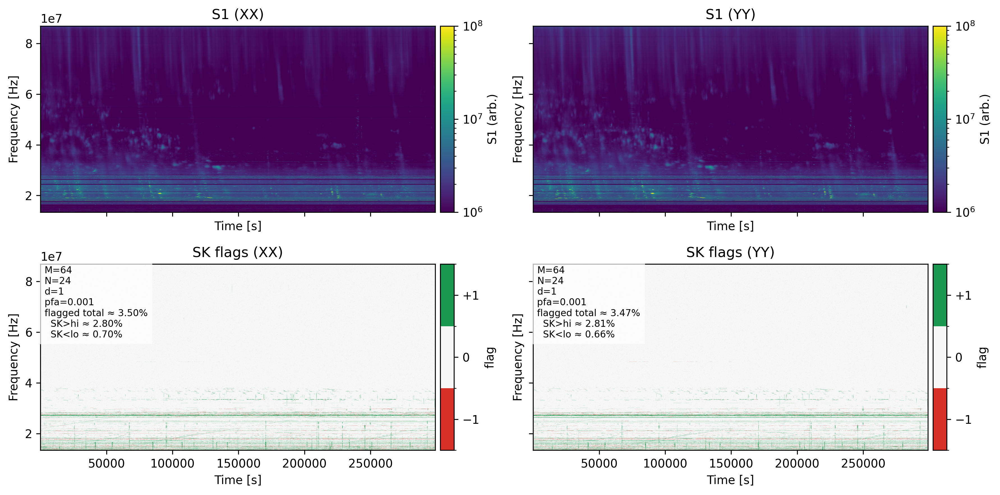

[SHOW] ovro_lwa_demo_outputs\png\060963_182827094797b4e9492_skstream_rfi_M64_F8_and_quick_rfi.png


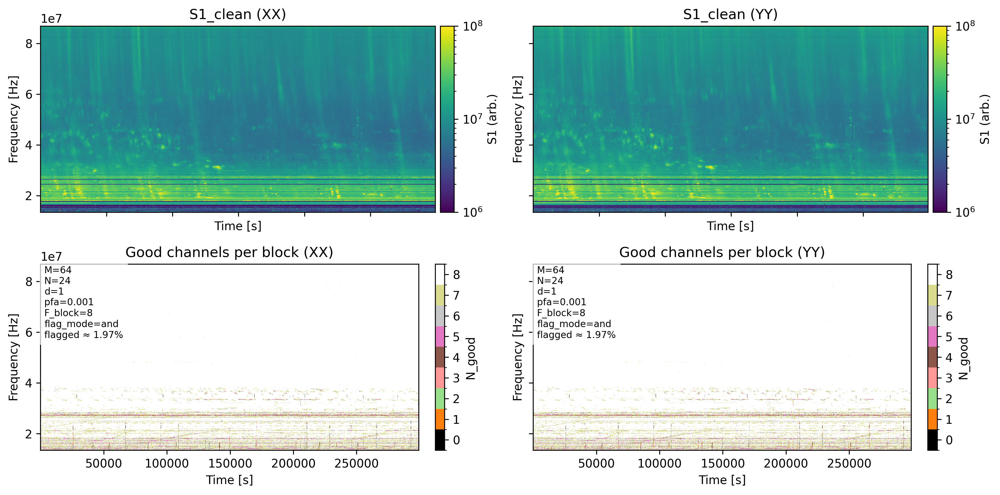

In [117]:
# Display Stage 1 quicklook PNG(s) from PNG_OUT
show_pngs_in_dir(PNG_OUT)


---

## 5. Stage 2 – RFI cleaning and frequency-block integration

In this stage we use `ovro_lwa_rfi_clean.py` to:

1. Read the SK stream file (`*_skstream.h5`).
2. Build a **good-data mask** based on SK flags:
   - Negative flags (SK < lo) and positive flags (SK > hi) mark RFI-contaminated samples.
3. Optionally combine flags between XX and YY using:
   - `separate` – independent masks for each polarization (default),
   - `or` – union of flags,
   - `and` – intersection of flags.
4. Integrate over **frequency blocks** of size `F_block` (e.g., 8 channels) for both:
   - S1 (to approximate total flux in that block),
   - N_good (how many good channels per time–block).

The output is an HDF5 file with:

- `s1_xx_clean`, `s1_yy_clean`,
- `mask_xx`, `mask_yy` (good-channel counts per block),
- Blocked frequency axis (`freq_block`) and time axis,
- Metadata: `M`, `N`, `d`, `pfa`, `F_block`, `flag_mode`.

As with Stage 1, once the RFI product is created, you can avoid recomputing it
by setting `RUN_RFI = False` and only re-running the RFI quicklook cell.


In [118]:
# ==========================
# STAGE 2: RFI CLEAN
# ==========================

if not os.path.exists(RFI_CLEAN_SCRIPT):
    raise FileNotFoundError(f"RFI-clean script not found: {RFI_CLEAN_SCRIPT}")

if not os.path.exists(skstream_file):
    raise FileNotFoundError(f"SK stream file not found: {skstream_file}")

print(f"[RFI] SK stream file: {skstream_file}")
print(f"[RFI] Output dir    : {RFI_OUT}")

rfi_out = os.path.abspath(RFI_OUT)

# Pattern for RFI result
rfi_pattern = os.path.join(rfi_out, f"{base_noext(skstream_file)}_rfi_*.h5")
existing_rfi = sorted(glob.glob(rfi_pattern))

if RUN_RFI or not existing_rfi:
    print("[RFI] Running ovro_lwa_rfi_clean.py ...")
    cmd = ["python", RFI_CLEAN_SCRIPT, skstream_file]
    if RFI_ARGS.strip():
        cmd.extend(shlex.split(RFI_ARGS))
    cmd.extend(["--out", rfi_out])
    run_cmd(cmd)
    existing_rfi = sorted(glob.glob(rfi_pattern))
else:
    print("[RFI] Skipping RFI stage (RUN_RFI=False and RFI product exists).")

if not existing_rfi:
    raise FileNotFoundError(f"No RFI product found for pattern: {rfi_pattern}")

rfi_file = existing_rfi[0]
print("\n[RFI] Using RFI file:", rfi_file)


[RFI] SK stream file: C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\stream\060963_182827094797b4e9492_skstream.h5
[RFI] Output dir    : ovro_lwa_demo_outputs\rfi
[RFI] Running ovro_lwa_rfi_clean.py ...
[CMD] python ovro_lwa_rfi_clean.py C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\stream\060963_182827094797b4e9492_skstream.h5 --F-block 8 --flag-mode and --out C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\rfi

[RFI] Using RFI file: C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\rfi\060963_182827094797b4e9492_skstream_rfi_M64_F8_and.h5


---

## 6. Stage 2 – Quicklook of RFI-cleaned products

Finally, we call `ovro_lwa_sk_quicklook.py` on the RFI-clean file.

For each polarization (XX, YY) we show a 2×2 layout:

- Top row: S1_clean (time vs. frequency-block).
- Bottom row: N_good (number of good channels per block), plotted with
  a discrete colormap:
  - 0 → black (no good channels),
  - F_block → white (all channels good),
  - intermediate values use distinct colors.

The annotation box on the N_good panels reports:

- SK parameters: M, N, d, pfa,
- `F_block` and `flag_mode`,
- Approximate fraction of data that was flagged.

Again, you can re-run this cell with different `QUICKLOOK_ARGS` to
change visualization without recomputing SK or RFI.


In [119]:
# ==========================
# STAGE 2: QUICKLOOK
# ==========================

if not os.path.exists(QUICKLOOK_SCRIPT):
    raise FileNotFoundError(f"Quicklook script not found: {QUICKLOOK_SCRIPT}")

if not os.path.exists(rfi_file):
    raise FileNotFoundError(f"RFI file not found: {rfi_file}")

png_out = os.path.abspath(PNG_OUT)
print(f"[QL2] RFI file      : {rfi_file}")
print(f"[QL2] PNG output dir: {png_out}")

cmd = ["python", QUICKLOOK_SCRIPT, rfi_file]
if QUICKLOOK_ARGS.strip():
    cmd.extend(shlex.split(QUICKLOOK_ARGS))
cmd.extend(["--out", png_out])

run_cmd(cmd)

print("[QL2] Quicklook done. Inspect PNG_OUT for generated figures.")


[QL2] RFI file      : C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\rfi\060963_182827094797b4e9492_skstream_rfi_M64_F8_and.h5
[QL2] PNG output dir: C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\png
[CMD] python ovro_lwa_sk_quicklook.py C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\rfi\060963_182827094797b4e9492_skstream_rfi_M64_F8_and.h5 --pol both --scale log --vmin 1e6 --vmax 1e8 --save-plot png --no-show --out C:\Users\gelu_\Dropbox\@Projects\pyGSK-fork\examples\ovro-lwa\ovro_lwa_demo_outputs\png
[QL2] Quicklook done. Inspect PNG_OUT for generated figures.


[SHOW] ovro_lwa_demo_outputs\png\060963_182827094797b4e9492_skstream_quick_skstream.png


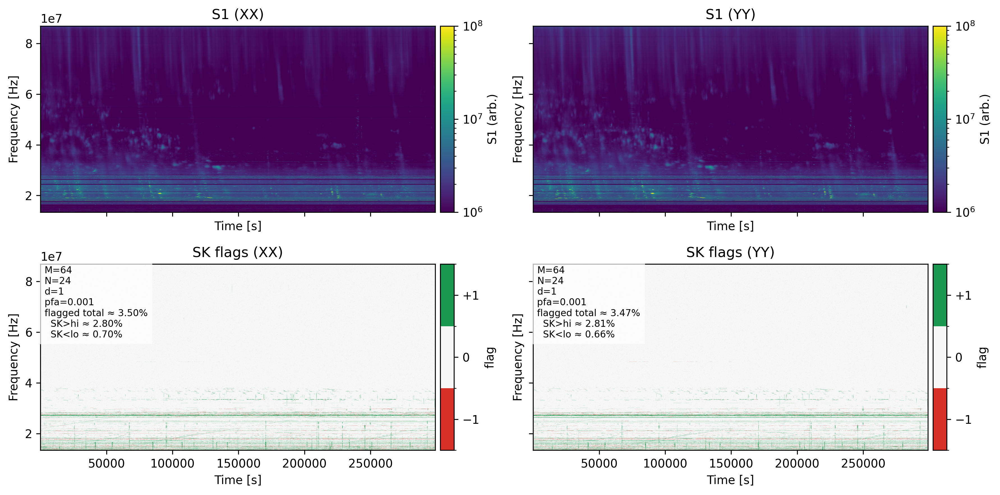

[SHOW] ovro_lwa_demo_outputs\png\060963_182827094797b4e9492_skstream_rfi_M64_F8_and_quick_rfi.png


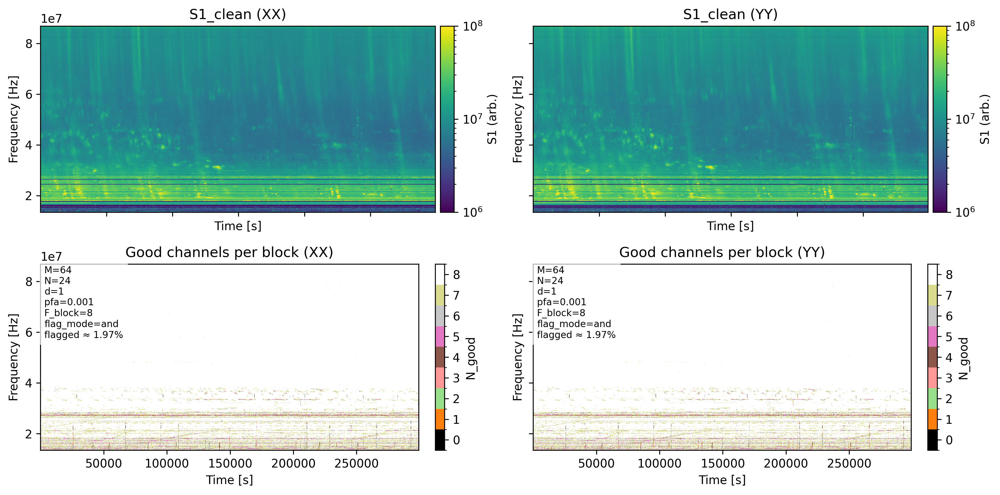

In [120]:
# Display Stage 2 (RFI–clean) quicklook PNG(s) from PNG_OUT
show_pngs_in_dir(PNG_OUT)


---

## 7. Summary and next steps

This notebook walks through a complete **OVRO–LWA SK analysis pipeline** for a single file:

1. **Streaming SK computation** (Stage 1)  
2. **Quicklook of SK stream products**  
3. **RFI cleaning and frequency-block integration** (Stage 2)  
4. **Quicklook of RFI-cleaned products**

Because each step is in a separate cell and the intermediate products
are stored on disk:

- Heavy steps (SK streaming, RFI cleaning) can be run once,
- Visualization steps can be re-run freely with different parameters.

Possible extensions:

- Compare different `F_block` and `flag_mode` settings for the same file.
- Overlay RFI-cleaned S1 with original S1 to assess how much flux is recovered.
- Wrap this notebook logic into a small API to integrate with other instruments.

Feel free to clone this structure for other instruments or future
SK-based pipelines.
